In [73]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [74]:
# undirected graph with 22 nodes
graph = {
    'A': {'B', 'C', 'D'},
    'B': {'A', 'E', 'F'},
    'C': {'A', 'G', 'H'},
    'D': {'A', 'I'},
    'E': {'B', 'J'},
    'F': {'B', 'J', 'K'},
    'G': {'C', 'L'},
    'H': {'C', 'M'},
    'I': {'D', 'N'},
    'J': {'E', 'F', 'O'},
    'K': {'F', 'P'},
    'L': {'G', 'Q'},
    'M': {'H', 'R'},
    'N': {'I', 'S'},
    'O': {'J', 'T'},
    'P': {'K', 'U'},
    'Q': {'L', 'R'},
    'R': {'M', 'Q', 'V'},
    'S': {'N', 'T'},
    'T': {'O', 'S', 'U'},
    'U': {'P', 'T', 'V'},
    'V': {'R', 'U'}
}

In [75]:
G = nx.Graph(graph) # converting graph in dictionary format to a networkx graph

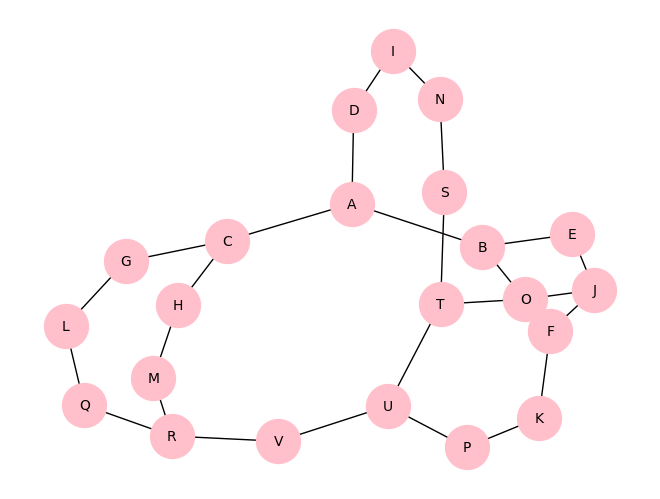

In [76]:
# draw graph function
def draw_graph(G):
    pos = nx.spring_layout(G,seed=0)
    nx.draw(G, pos, with_labels=True, node_color='pink', node_size=1000, font_size=10)
    plt.show()

draw_graph(G)

In [77]:
#DFS
order =[]
def dfs (graph, node, visited=None):
    if visited is None:
        visited = set()
    
    visited.add(node)
    order.append(('visit', node))
    print(f'Visited node {node}')

    for new_node in (graph[node] - visited):
        dfs(graph, new_node, visited)
        order.append(('backtrack', node))   
    
    return order

dfs_nodes = dfs(graph, 'A') # running DFS; starting from node A

Visited node A
Visited node D
Visited node I
Visited node N
Visited node S
Visited node T
Visited node U
Visited node V
Visited node R
Visited node M
Visited node H
Visited node C
Visited node G
Visited node L
Visited node Q
Visited node Q
Visited node P
Visited node K
Visited node F
Visited node J
Visited node E
Visited node B
Visited node O
Visited node B
Visited node O
Visited node B
Visited node C


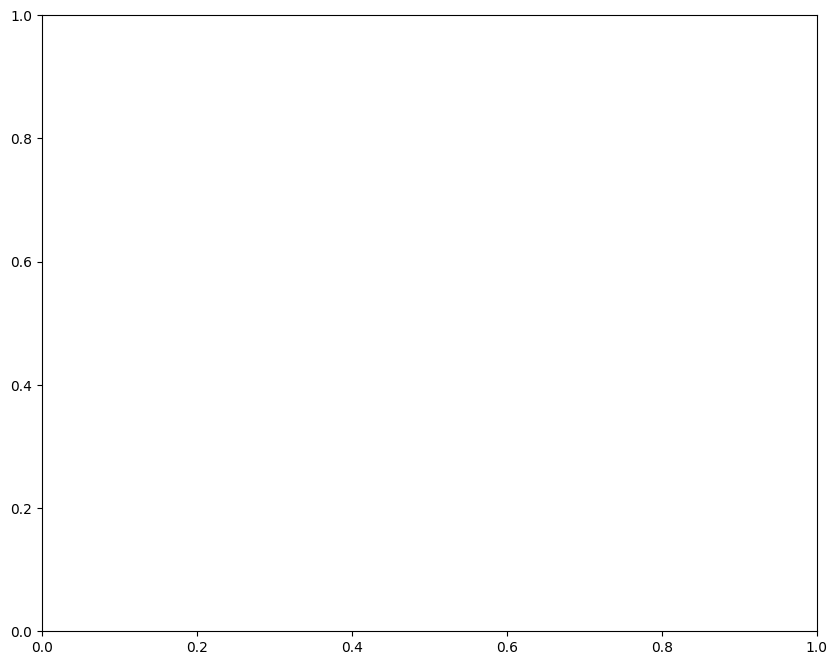

In [78]:
# update function to be looped over for each frame during animation

fig, ax = plt.subplots(figsize=(10,8));
pos = nx.spring_layout(G, seed=0);

def update(i):
    ax.clear();

    visited_so_far = set()
    current_node = None

    for type_of_visit, node in dfs_nodes[:i+1]:
        if type_of_visit == 'visit':
            visited_so_far.add(node)
        current_node = node

    node_colors=[]
    for node in G.nodes():
        if node == current_node: node_colors.append('pink')
        elif node in visited_so_far: node_colors.append('skyblue')
        else: node_colors.append('lightgray')
    
    nx.draw(G, pos, with_labels=True, node_color=node_colors, ax=ax, node_size=1000, font_weight='bold')
    ax.set_title(f'DFS Traversal: Step {i+1}/{len(dfs_nodes)}', fontsize = 16);


In [79]:
# dfs traversal animation

anim = animation.FuncAnimation(fig, update, frames=len(dfs_nodes), interval= 1000, repeat=False)

from IPython.display import HTML
HTML(anim.to_jshtml())

In [ ]:
anim.save('dfs.gif', writer='pillow', fps=2)
from IPython.display import Image
Image(filename='dfs.gif')

In [81]:
%timeit dfs(graph, 'A') # time complexity - method 1

Visited node A
Visited node D
Visited node I
Visited node N
Visited node S
Visited node T
Visited node U
Visited node V
Visited node R
Visited node M
Visited node H
Visited node C
Visited node G
Visited node L
Visited node Q
Visited node Q
Visited node P
Visited node K
Visited node F
Visited node J
Visited node E
Visited node B
Visited node O
Visited node B
Visited node O
Visited node B
Visited node C
Visited node A
Visited node D
Visited node I
Visited node N
Visited node S
Visited node T
Visited node U
Visited node V
Visited node R
Visited node M
Visited node H
Visited node C
Visited node G
Visited node L
Visited node Q
Visited node Q
Visited node P
Visited node K
Visited node F
Visited node J
Visited node E
Visited node B
Visited node O
Visited node B
Visited node O
Visited node B
Visited node C
Visited node A
Visited node D
Visited node I
Visited node N
Visited node S
Visited node T
Visited node U
Visited node V
Visited node R
Visited node M
Visited node H
Visited node C
Visited no

In [82]:
%load_ext memory_profiler
%memit dfs(graph, 'A')  # space complexity - method 1

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler
Visited node A
Visited node D
Visited node I
Visited node N
Visited node S
Visited node T
Visited node U
Visited node V
Visited node R
Visited node M
Visited node H
Visited node C
Visited node G
Visited node L
Visited node Q
Visited node Q
Visited node P
Visited node K
Visited node F
Visited node J
Visited node E
Visited node B
Visited node O
Visited node B
Visited node O
Visited node B
Visited node C
peak memory: 272.18 MiB, increment: 0.04 MiB


In [83]:
# time and space complexity - method 2

import psutil
import os
import time

def measure_dfs(graph, start_node='0'):
    process = psutil.Process(os.getpid())

    mem_before = process.memory_info().rss / (1024 * 1024)  # in MB
    start = time.time()

    dfs(graph, start_node)

    end = time.time()
    mem_after = process.memory_info().rss / (1024 * 1024)  # in MB

    return (end - start), (mem_after - mem_before)

In [84]:
time_taken, memory_used = measure_dfs(graph, 'A')
print(f"Time taken: {time_taken:.5f} seconds")
print(f"Memory used: {memory_used:.5f} MB")

Visited node A
Visited node D
Visited node I
Visited node N
Visited node S
Visited node T
Visited node U
Visited node V
Visited node R
Visited node M
Visited node H
Visited node C
Visited node G
Visited node L
Visited node Q
Visited node Q
Visited node P
Visited node K
Visited node F
Visited node J
Visited node E
Visited node B
Visited node O
Visited node B
Visited node O
Visited node B
Visited node C
Time taken: 0.00232 seconds
Memory used: 0.00000 MB


In [85]:
# random graph generator

def generate_graph(n_nodes, edge_factor=3):
    G = nx.gnm_random_graph(n_nodes, n_nodes * edge_factor)
    graph = {str(node): set(map(str, G.neighbors(node))) for node in G.nodes}
    return graph

In [86]:
# generating graphs with various increasing sizes

node_sizes = [100, 200, 500, 700, 1000]
times = []
memories = []

for size in node_sizes:
    print(f"Running for {size} nodes...")
    g = generate_graph(size)
    t, m = measure_dfs(g)
    times.append(t)
    memories.append(m)

Running for 100 nodes...
Visited node 0
Visited node 24
Visited node 13
Visited node 36
Visited node 19
Visited node 90
Visited node 96
Visited node 63
Visited node 91
Visited node 78
Visited node 27
Visited node 61
Visited node 84
Visited node 69
Visited node 80
Visited node 15
Visited node 57
Visited node 88
Visited node 76
Visited node 67
Visited node 9
Visited node 8
Visited node 49
Visited node 81
Visited node 59
Visited node 25
Visited node 50
Visited node 43
Visited node 40
Visited node 70
Visited node 52
Visited node 1
Visited node 32
Visited node 74
Visited node 66
Visited node 12
Visited node 39
Visited node 6
Visited node 77
Visited node 35
Visited node 45
Visited node 95
Visited node 85
Visited node 33
Visited node 7
Visited node 28
Visited node 64
Visited node 89
Visited node 10
Visited node 65
Visited node 18
Visited node 34
Visited node 98
Visited node 20
Visited node 48
Visited node 68
Visited node 29
Visited node 51
Visited node 60
Visited node 56
Visited node 73
Visit

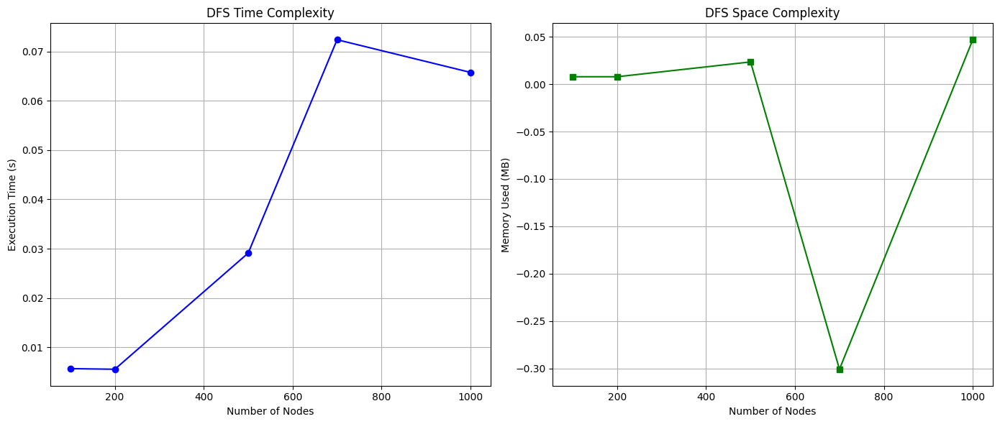

In [87]:
# plotting time complexity and space complexity

fig, axs = plt.subplots(1, 2, figsize=(14, 6))

axs[0].plot(node_sizes, times, marker='o', color='blue')
axs[0].set_title('DFS Time Complexity')
axs[0].set_xlabel('Number of Nodes')
axs[0].set_ylabel('Execution Time (s)')
axs[0].grid(True)

axs[1].plot(node_sizes, memories, marker='s', color='green')
axs[1].set_title('DFS Space Complexity')
axs[1].set_xlabel('Number of Nodes')
axs[1].set_ylabel('Memory Used (MB)')
axs[1].grid(True)

plt.tight_layout()
plt.show()